<a href="https://colab.research.google.com/github/adnan119/DenseObjectDetection/blob/main/TFhubmodels.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%cd './drive/MyDrive/Omdena/Optimiz/OptimizData/Data/'

/content/drive/MyDrive/Omdena/Optimiz/OptimizData/Data


In [ ]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import cv2
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

In [ ]:
print(tf.__version__)

2.5.0


In [ ]:
# Clone the tensorflow models repository
#!git clone --depth 1 https://github.com/tensorflow/models

In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .


In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  image = None
  if(path.startswith('http')):
    response = urlopen(path)
    image_data = response.read()
    image_data = BytesIO(image_data)
    image = Image.open(image_data)
  else:
    image_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(image_data))

  (im_width, im_height) = image.size
  print(image.size)
  return np.array(image.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)

# **Model: MobileNet_v2**

In [ ]:
model_handle = "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1"
print('loading model...')
hub_model = hub.load(model_handle)
detector = hub_model.signatures['default']
print('model loaded!')

loading model...
model loaded!


In [ ]:
hub_model.signatures.keys()

KeysView(_SignatureMap({'default': <ConcreteFunction pruned(images) at 0x7F3560DF8090>}))

In [ ]:
image = 'IMG_4718.JPG'
image_np = load_image_into_numpy_array(image)
image_np.shape
# plt.figure(figsize=(24,32))
# plt.imshow(image_np[0])
# plt.show()

(1920, 1440)


(1, 1440, 1920, 3)

In [ ]:
image_tf = tf.convert_to_tensor(image_np, dtype=tf.float32)
# image_tf_2 = tf.convert_to_tensor(image_np, dtype=tf.uint8)
results = detector(image_tf)
# results_2 = detector_2(image_tf_2)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
# result_2 = {key:value.numpy() for key,value in results_2.items()}

print(result.keys())
# print(result_2.keys())

print(result['detection_scores'].shape)
print(results['detection_class_labels'].shape)
print(results['detection_boxes'].shape)

print(type(results['detection_boxes']))
print(type(results['detection_class_labels']))
print(type(results['detection_scores']))

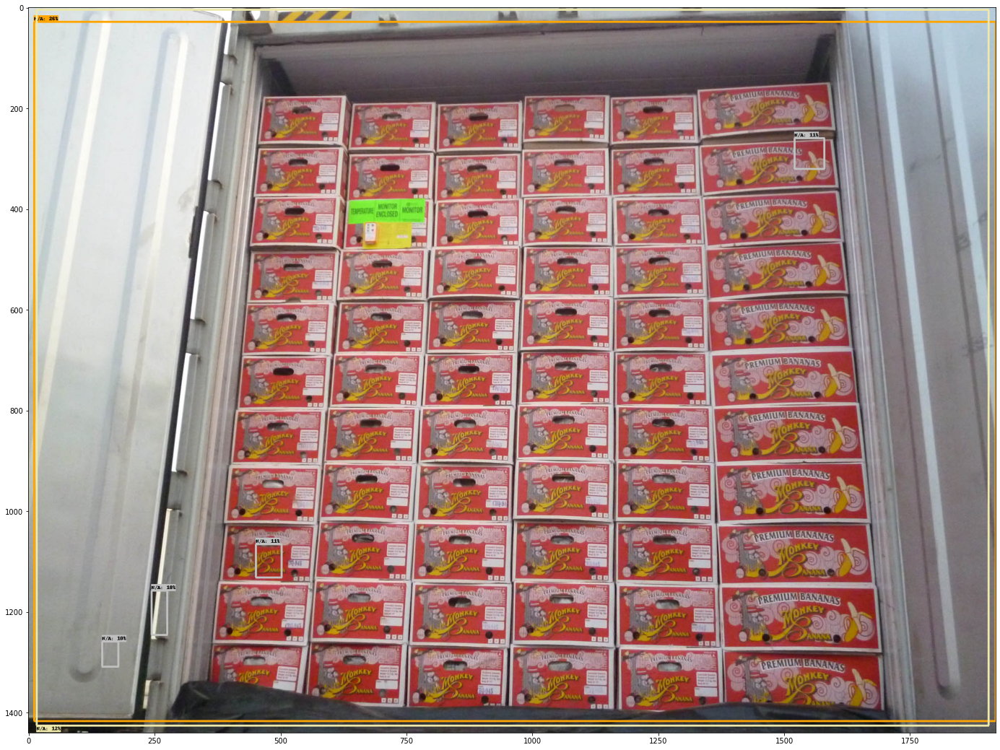

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
db = result['detection_boxes']
dcl = result['detection_class_labels']
ds = result['detection_scores']

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      db,
      (dcl + label_id_offset).astype(int),
      ds,
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.10,
      agnostic_mode=False)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

# **Model: CenterNet Object detection model with the Hourglass backbone**

In [ ]:
CenterNet = "https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1"
print('loading model...')
hub_model = hub.load(CenterNet)
detector = hub_model.signatures['serving_default']
print('model loaded!')

loading model...
model loaded!


In [ ]:
hub_model.signatures.keys()

KeysView(_SignatureMap({'serving_default': <ConcreteFunction signature_wrapper(input_tensor) at 0x7F354C15A250>}))

In [ ]:
image = 'IMG_4720.JPG'
image_np = load_image_into_numpy_array(image)
image_np.shape

(600, 592)


(1, 592, 600, 3)

In [ ]:
image_tf = tf.convert_to_tensor(image_np, dtype=tf.uint8)
# image_tf_2 = tf.convert_to_tensor(image_np, dtype=tf.uint8)
results = detector(image_tf)
# results_2 = detector_2(image_tf_2)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
# result_2 = {key:value.numpy() for key,value in results_2.items()}

print(result.keys())
# print(result_2.keys())


dict_keys(['detection_scores', 'detection_classes', 'num_detections', 'detection_boxes'])


In [ ]:
print(result['detection_scores'].shape)
print(results['detection_classes'].shape)
print(results['detection_boxes'].shape)

print(type(results['detection_boxes']))
print(type(results['detection_classes']))
print(type(results['detection_scores']))

(1, 100)
(1, 100)
(1, 100, 4)
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>


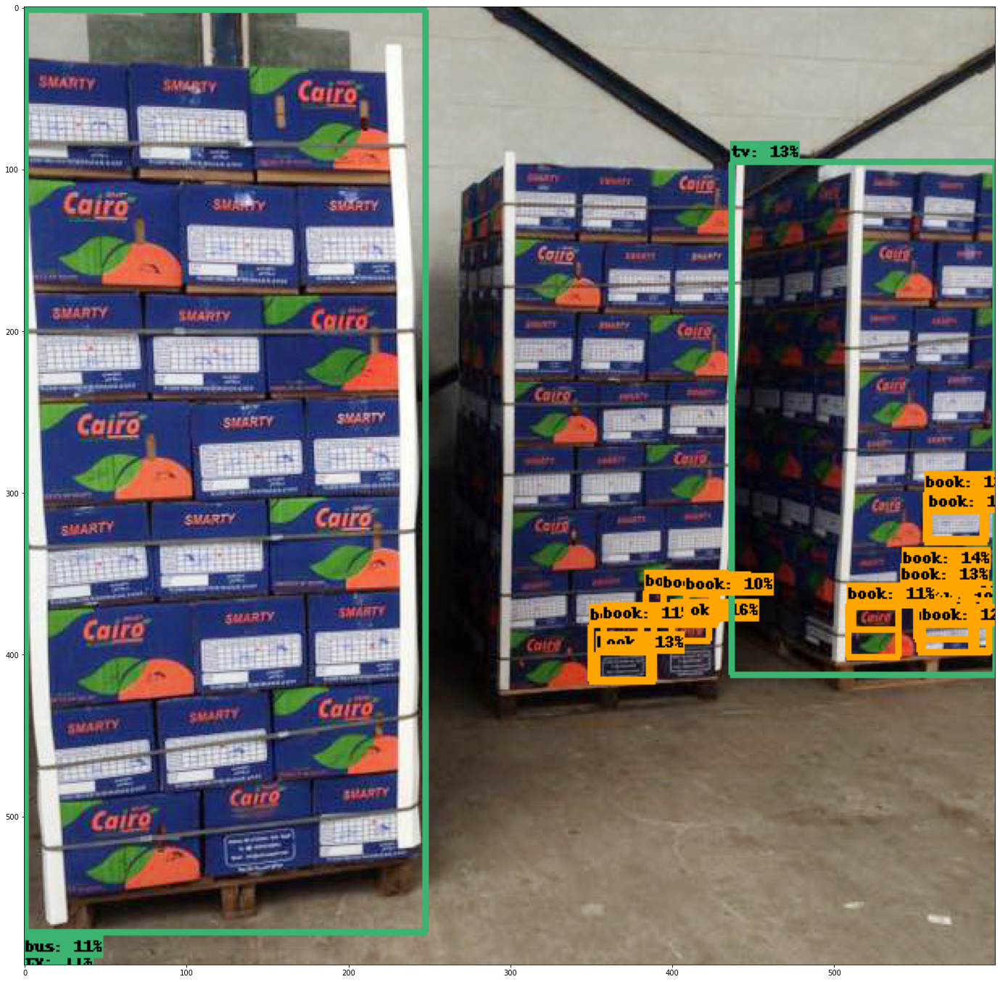

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
db = result['detection_boxes']
dcl = result['detection_classes']
ds = result['detection_scores']

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      db[0],
      (dcl[0] + label_id_offset).astype(int),
      ds[0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.10,
      agnostic_mode=False)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

# **Model: EfficientDet Object detection model (SSD with EfficientNet-b3 + BiFPN feature extractor)**

In [ ]:
EfficientDet = "https://tfhub.dev/tensorflow/efficientdet/d3/1"
print('loading model...')
hub_model = hub.load(EfficientDet)
detector = hub_model.signatures[list(hub_model.signatures.keys())[0]]
print('model loaded!')

loading model...


model loaded!


In [ ]:
image = 'IMG_4720.JPG'
image_np = load_image_into_numpy_array(image)
image_np.shape

(600, 592)


(1, 592, 600, 3)

In [ ]:
image_tf = tf.convert_to_tensor(image_np, dtype=tf.uint8)
# image_tf_2 = tf.convert_to_tensor(image_np, dtype=tf.uint8)
results = detector(image_tf)
# results_2 = detector_2(image_tf_2)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
# result_2 = {key:value.numpy() for key,value in results_2.items()}

print(result.keys())
# print(result_2.keys())


dict_keys(['detection_classes', 'num_detections', 'detection_boxes', 'raw_detection_boxes', 'detection_scores', 'raw_detection_scores', 'detection_anchor_indices', 'detection_multiclass_scores'])


In [ ]:
print(result['detection_scores'].shape)
print(results['detection_classes'].shape)
print(results['detection_boxes'].shape)

print(type(results['detection_boxes']))
print(type(results['detection_classes']))
print(type(results['detection_scores']))

(1, 100)
(1, 100)
(1, 100, 4)
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>


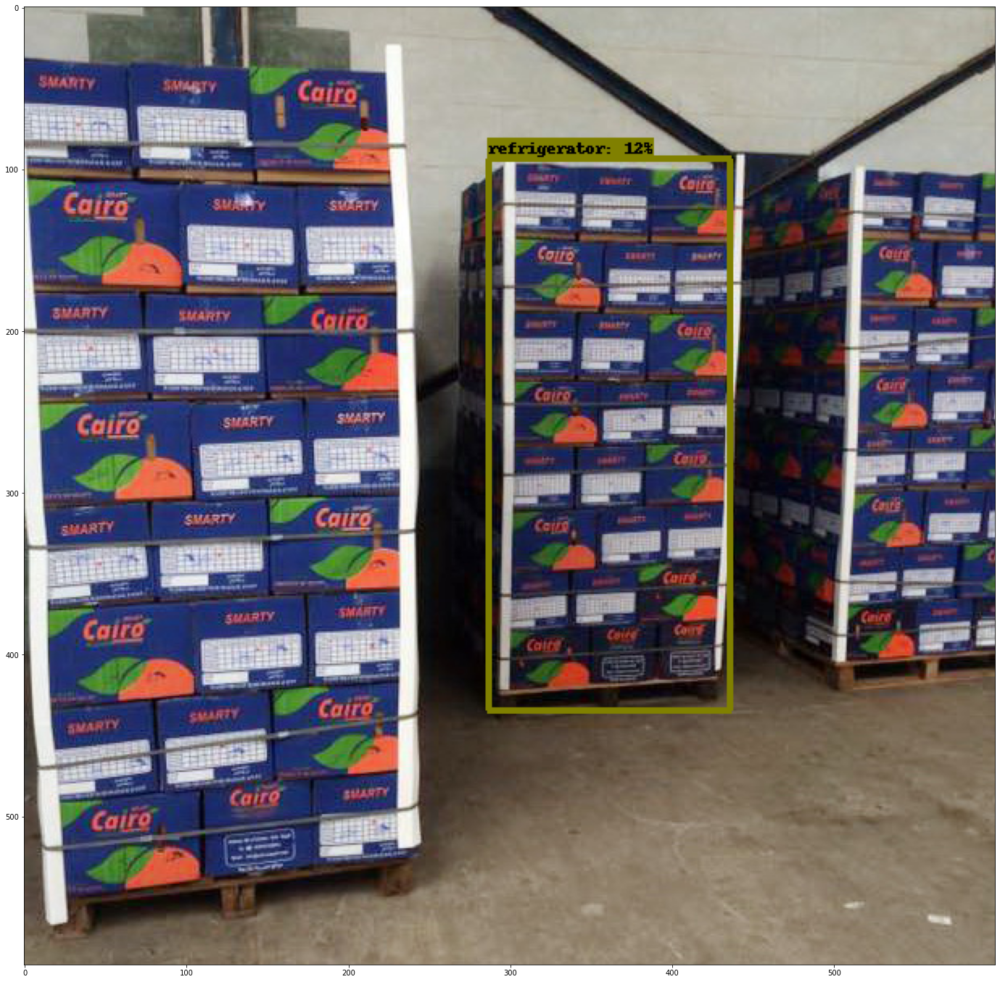

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
db = result['detection_boxes']
dcl = result['detection_classes']
ds = result['detection_scores']

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      db[0],
      (dcl[0] + label_id_offset).astype(int),
      ds[0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.10,
      agnostic_mode=False)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()

# **Model: RetinaNet(SSD with Resnet 101 v1)**

In [ ]:
RetinaNet = "https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1"
print('loading model...')
hub_model = hub.load(RetinaNet)
detector = hub_model.signatures[list(hub_model.signatures.keys())[0]]
print('model loaded!')

loading model...
model loaded!


In [ ]:
image = 'IMG_4720.JPG'
image_np = load_image_into_numpy_array(image)
image_np.shape

(600, 592)


(1, 592, 600, 3)

In [ ]:
image_tf = tf.convert_to_tensor(image_np, dtype=tf.uint8)
# image_tf_2 = tf.convert_to_tensor(image_np, dtype=tf.uint8)
results = detector(image_tf)
# results_2 = detector_2(image_tf_2)

# different object detection models have additional results
# all of them are explained in the documentation
result = {key:value.numpy() for key,value in results.items()}
# result_2 = {key:value.numpy() for key,value in results_2.items()}

print(result.keys())
# print(result_2.keys())


dict_keys(['detection_multiclass_scores', 'detection_classes', 'num_detections', 'detection_boxes', 'raw_detection_boxes', 'detection_scores', 'raw_detection_scores', 'detection_anchor_indices'])


In [ ]:
print(result['detection_scores'].shape)
print(results['detection_classes'].shape)
print(results['detection_boxes'].shape)

print(type(results['detection_boxes']))
print(type(results['detection_classes']))
print(type(results['detection_scores']))

(1, 100)
(1, 100)
(1, 100, 4)
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>


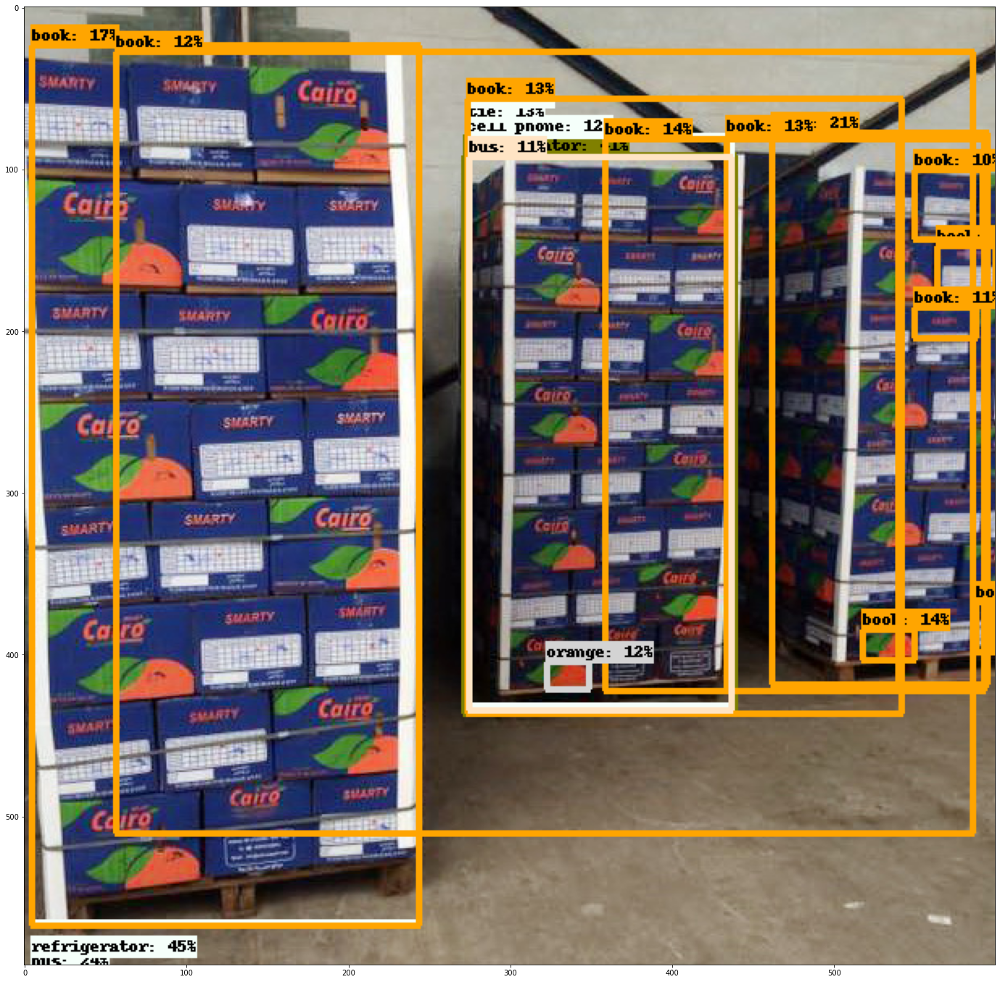

In [ ]:
label_id_offset = 0
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
db = result['detection_boxes']
dcl = result['detection_classes']
ds = result['detection_scores']

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      db[0],
      (dcl[0] + label_id_offset).astype(int),
      ds[0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.10,
      agnostic_mode=False)

plt.figure(figsize=(24,32))
plt.imshow(image_np_with_detections[0])
plt.show()